# From Scan to Search: A Digital Pipeline for Medieval Legal Consilia

**Baldo de Ubaldis, *Consilia* (vol. 1) — a full walkthrough**

This notebook documents every step of a pipeline that turns raw page scans of a late
15th-century legal print into a structured, searchable digital edition.

| Step | Tool | Output |
|------|------|--------|
| OCR transcription | Transkribus | PageXML per page |
| Parsing | `parse_pagexml.py` | Python dataclasses |
| Segmentation | `segment_consilia.py` | Structured consilium records |
| Dehyphenation | `lb_detector.py` (Flair) | Clean joined text |
| Embedding | `embed_consilia.py` (BGE-M3) | SafeTensors float32 matrix |
| Frontend | `index.html` / `search.html` | Static web reader + search |

**Hybrid notebook:** cells that load pre-computed output files run instantly.
Cells labelled *Reference* show the pipeline source code for explanation only
— the full run takes ~7 min (Flair model) and requires the Transkribus data export.


---
## 1  Historical Context

### What is a *consilium*?

A *consilium* (pl. *consilia*) is a written legal opinion produced by a university-trained
jurist, typically commissioned by a court or a party in litigation. They flourished between
roughly 1250 and 1600 and constitute one of the most important genres of medieval and early
modern legal literature. A single volume could contain hundreds of opinions on topics ranging
from feudal succession to canon law to commercial contracts.

### Baldo de Ubaldis (1327–1400)

Baldo was one of the most prolific and influential jurists of the Middle Ages, a student of
Bartolus of Sassoferrato and professor at Perugia, Florence, Pavia, and Padua. His *consilia*
were collected and printed repeatedly; this pipeline targets the **first volume of his printed
*Consilia***, a late 15th-century edition of 324 pages containing 500 numbered opinions.

### The challenge

The text survives only as page scans. Transcription via Transkribus (an HTR platform) yields
raw text riddled with OCR errors typical of Gothic typefaces: `v`/`u` and `i`/`j` confusion,
misread Roman numerals, split headings across two text regions, invisible word-breaks at
line ends. The pipeline must recover structure from this noisy material.


---
## 2  The Source Material

Below is page 30 of the print — the page on which *Consilium* XLIIII begins.
Notice the two-column layout, the large `CONSILIVM` heading with Roman numeral,
the numbered summary items in the first column, and the body text opening *In Christi nomine*.


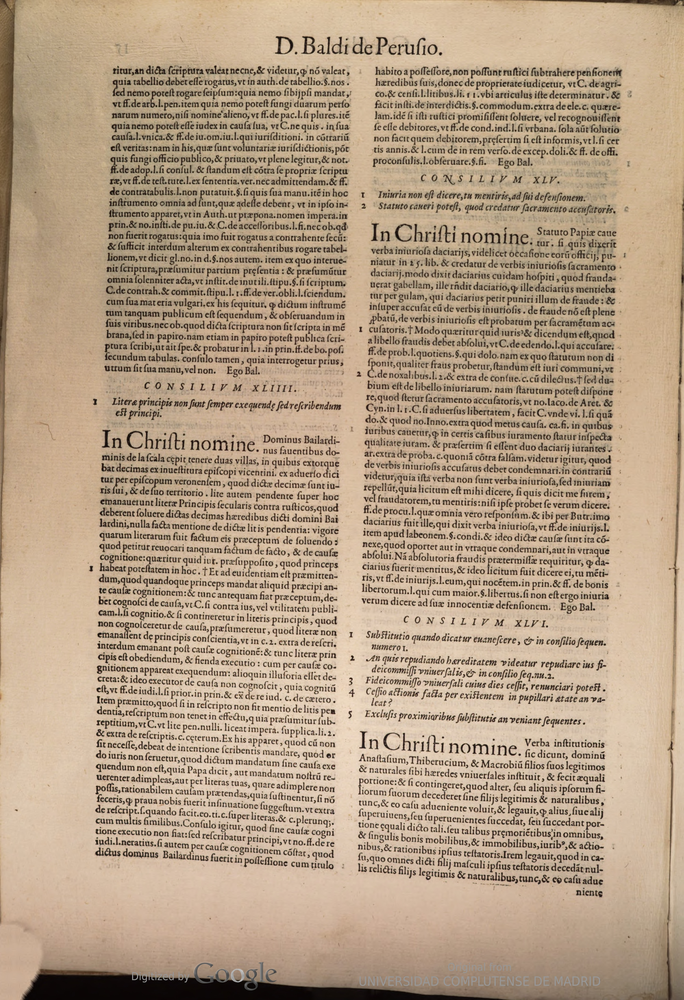

In [18]:
from IPython.display import Image, display
from pathlib import Path

# Raw page scan as exported from Transkribus
display(Image('data/Baldo_29618397/Baldo_Cons_Print_Venice_1575_v1/0030.jpg', width=700))


### The PageXML format

Transkribus exports each page as a **PageXML** file. Each file contains a tree of
`TextRegion` → `TextLine` elements. Every `TextLine` carries:
- `<Unicode>` — the transcribed text
- `<Coords>` — a polygon bounding box (pixel coordinates)
- `<Baseline>` — the baseline polyline
- A `custom=` attribute encoding reading order and optional region type
  (`header`, `marginalia`, etc.)

Running-header regions are discarded; all other regions are read in declared reading order.


In [19]:
# Show a representative XML excerpt from the same page
xml_text = Path('data/Baldo_29618397/Baldo_Cons_Print_Venice_1575_v1/page/0030.xml').read_text(encoding='utf-8')

lines = xml_text.splitlines()
for i, line in enumerate(lines):
    if '<TextLine' in line and 'readingOrder' in line:
        print('\n'.join(lines[i-1 : i+10]))
        print('    ...')
        break


            <Coords points="408,107 2684,107 2684,248 408,248"/>
            <TextLine id="TextRegion_1763116031621_1063_tl_1" custom="readingOrder {index:0;}">
                <Coords points="1168,249 1666,234 1923,260 1920,135 1783,163 1747,133 1541,116 1412,152 1167,124"/>
                <Baseline points="1176,229 1220,226 1265,226 1310,226 1355,226 1399,226 1444,229 1489,229 1534,229 1578,232 1623,232 1668,232 1713,232 1758,232 1802,232 1847,232 1892,235 1925,241"/>
                <TextEquiv>
                    <Unicode>D. Baldi de Perusio.</Unicode>
                </TextEquiv>
            </TextLine>
            <TextEquiv>
                <Unicode></Unicode>
            </TextEquiv>
    ...


---
## 3  Pipeline Overview

```
 PageXML files (one per page)
      |
      v
 parse_pagexml.py --------------------> LineRef stream
      |                                 (text, bbox, page, hyphen flag)
      v
 segment_consilia.py -----------------> list[Consilium]
      |  * colinear-split merge         (id, n, roman, title,
      |  * heading detection             summary, body, sources)
      |  * state machine
      |  * sequence healing
      v
 lb_detector.py (Flair) -------------> joined text per section
      |  * pair: line_i <lb/> line_i+1
      |  * WB = merge,  NB = space
      v
 output/consilia.json
      |
      v
 embed_consilia.py (BGE-M3) ----------> embeddings.safetensors
      |  * title + summary + body          Float32[501, 1024]
      |  * multilingual (Latin/DE/EN)
      |  * re-runs only when JSON changed
      v
 index.html / search.html  (static GitHub Pages frontend)
```


---
## 4  Stage 1: Parsing PageXML

`parse_pagexml.py` reads each XML file with Python's standard `xml.etree` library and
emits a flat list of `LineRef` objects — one per transcribed line — with:

```python
@dataclass
class LineRef:
    text:        str    # transcribed Unicode text
    page:        str    # e.g. '0030.xml'
    region:      str    # TextRegion id
    coords:      list   # bounding-box polygon
    hyphen:      bool   # True when line ends with a soft-hyphen marker
    width_ratio: float  # line width / column width (used in heading detection)
```

Running headers are silently dropped. The resulting stream is passed as an iterator
to the segmenter.


In [20]:
# ---- REFERENCE ---------------------------------------------------------
# This cell actually runs (data/ is required) and shows the parsed output.
import sys
sys.path.insert(0, 'src')
from parse_pagexml import parse_pagexml

page = parse_pagexml(Path('data/Baldo_29618397/Baldo_Cons_Print_Venice_1575_v1/page/0030.xml'))

print(f'Page   : {page.filename}')
print(f'Regions: {len(page.regions)}')

for region in page.regions[:2]:
    print(f'\nRegion {region.region_id!r}  type={region.region_type!r}')
    for line in region.lines[:4]:
        print(f'  hyphen={line.has_soft_hyphen}  {line.text[:70]!r}')
    if len(region.lines) > 4:
        print(f'  ... ({len(region.lines)} lines total)')


Page   : 0030.xml
Regions: 3

Region 'TextRegion_1763116031621_1063'  type='header'
  hyphen=False  'D. Baldi de Perusio.'

Region 'TextRegion_1763116046644_1068'  type='unknown'
  hyphen=False  'ritur, an dicta scriptura valeat necne, et videtur, quod non valeat,'
  hyphen=False  'quia tabellio debet esse rogatus, vt in auth. de tabellio. §. nos.'
  hyphen=False  'sed nemo potest rogare seipsum: quia nemo sibi ipsi mandat,'
  hyphen=True  'vt ff. de arb. l. pen. item quia nemo potest fungi duarum perso¬'
  ... (71 lines total)


---
## 5  Stage 2: Consilium Segmentation

This is the most complex stage. `segment_consilia.py` drives a state machine over the
flat line stream and identifies three structural zones within each consilium: the
**heading**, the **summary** (numbered legal theses), and the **body** (full argument).

### 5.1  State machine

```
 +----------+  heading detected  +---------+  body opener  +------+
 |  BEFORE  | -----------------> | SUMMARY | ------------> | BODY |
 +----------+                    +---------+               +------+
                                     |  ^  next heading        |
                                     |  +--  flush consilium  --+
```

A *body opener* is a line beginning with *In Christi nomine*, *In nomine Domini*,
or a leading dagger `†` — the canonical opening formulas of Baldo's opinions.

### 5.2  Heading detection

Three strategies in priority order:

1. **Regex** — matches `CONSILIVM` + Roman numeral with ~20 OCR-error variants
   (doubled letters, missing letters, misread letters, truncated prefixes)
2. **OCR normalisation** — replaces `e` sandwiched between Roman-numeral characters
   with `C` before retrying the regex (catches `CCCeV` → `CCCCV` = 405)
3. **Geometric fallback** — all-caps lines narrower than 58% of column width that
   are not numbered summary items (used when the numeral is too garbled for any regex)

Two pre-processing passes run before the state machine:
- **Colinear split merge**: two adjacent text regions at the same vertical position
  that together form a heading are merged (recovered 4 headings)
- **Text-based split merge**: consecutive narrow all-caps lines that jointly match
  the heading regex (recovered 7 headings)

Section labels like `CASVS` and `ADDITIO BAL.` are explicitly excluded from the
geometric fallback to prevent false positives.

### 5.3  Sequence healing

After segmentation a post-processing pass corrects OCR-garbled Roman numerals.
If a consilium's `n` is out of sequence and exactly one number is missing between
its neighbours, it is reclassified to that number.
This recovered ~18 consilia (e.g. `CXIII` misread → healed to n=93).


### 5.4  Debug visualisation

The debug visualiser (`debug_visualize.py`) writes annotated JPEG images with
colour-coded bounding boxes:

- **Green** — regex match
- **Orange** — geometric fallback
- **Cyan** — merged split heading
- **Red** — heading with no body opener found


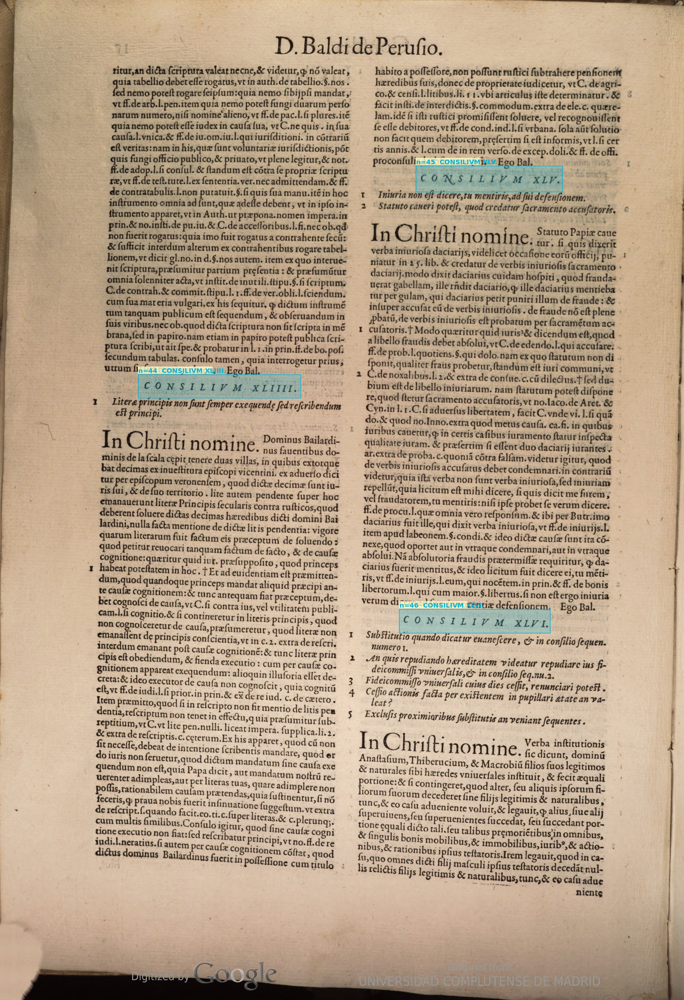

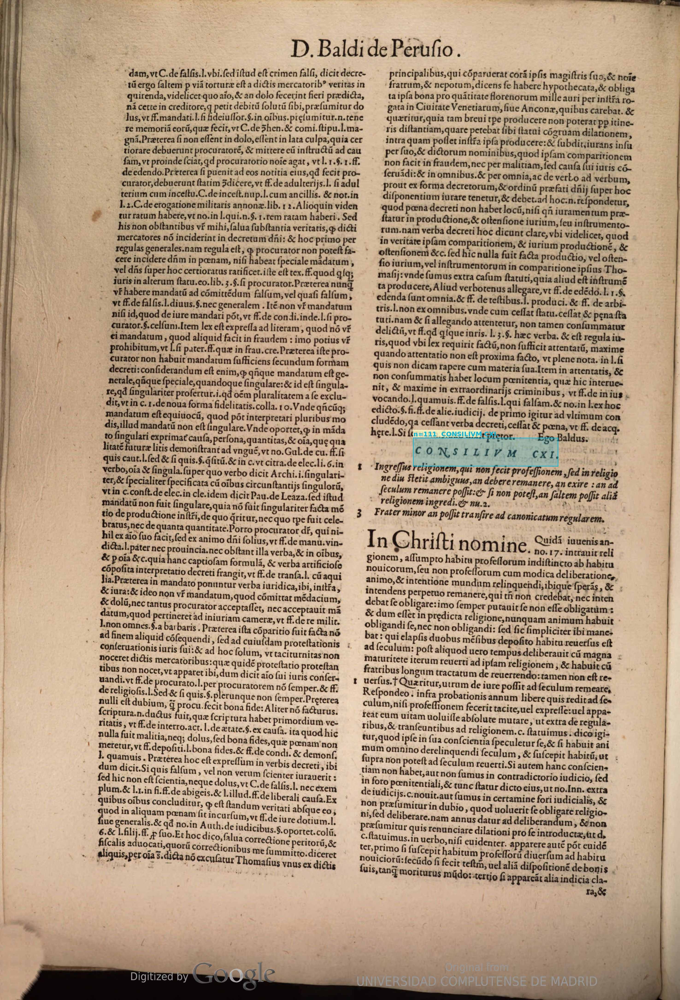

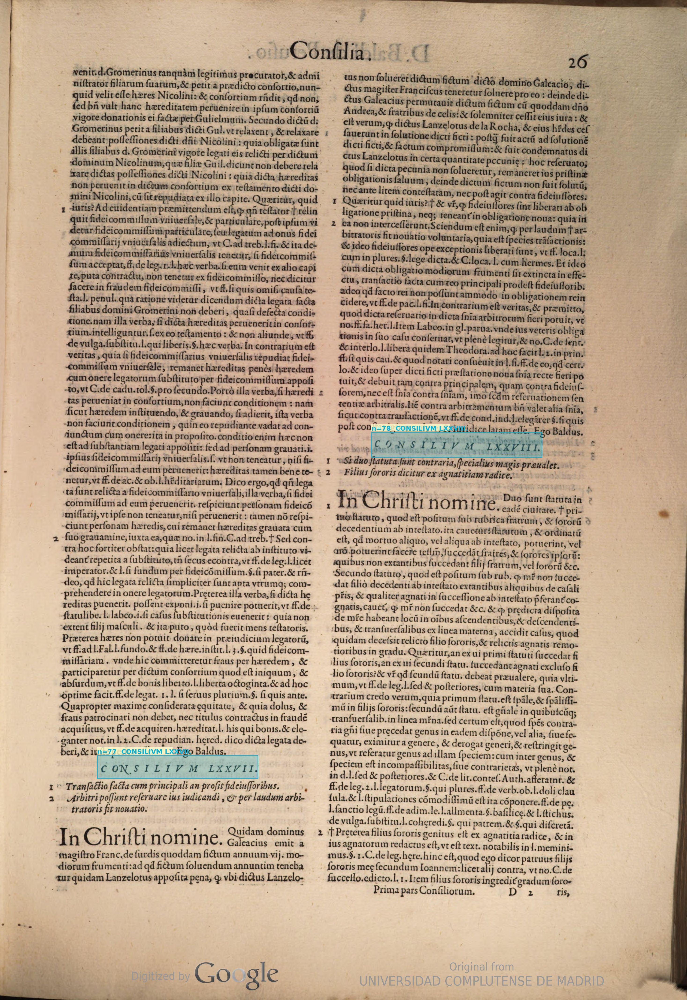

In [21]:
# Annotated debug image for the same page
display(Image('output/debug/Baldo_Cons_Print_Venice_1575_v1/0030_debug.jpg', width=700))
display(Image('output/debug/Baldo_Cons_Print_Venice_1575_v1/0066_debug.jpg', width=700))
display(Image('output/debug/Baldo_Cons_Print_Venice_1575_v1/0051_debug.jpg', width=700))


---
## 6  Stage 3: Line-Break Dehyphenation

Medieval printers regularly broke words across line ends without any visible marker.
Transkribus marks *some* invisible breaks with a soft hyphen `¬`, but many go
unmarked. Simply inserting a space at every line break produces errors like
*"expres- sam permittentem"* instead of *"expressam permittentem"*.

### The Flair sequence tagger

The model `mschonhardt/latin-contextual-lb-detector` classifies every line break in
context. Each adjacent pair of lines becomes one Flair `Sentence`:

```
"expressampermiiten <lb/> tem in facto"
```

The `<lb/>` token receives one of two labels:

| Label | Meaning | Action |
|-------|---------|--------|
| `WB`  | Word **continues** across the break | merge — no space |
| `NB`  | Word **boundary** at this break | insert a space |

> **Note:** the labels are reversed from standard NLP convention (where WB = word
> boundary). This is a property of how this particular model was trained and must
> not be changed.

All pairs for one text section are batch-predicted in a single `tagger.predict()`
call. The full run over 501 consilia takes ~7 minutes.

The heuristic fallback (`--no-lb-model`) only merges lines ending with `¬`
and completes in ~2 seconds, but misses invisible breaks.


In [22]:
import sys, json
from pathlib import Path
sys.path.insert(0, 'src')
from parse_pagexml import parse_pagexml
from lb_detector import _get_tagger, _LB, _SOFT_HYPHEN, join_lines
from flair.data import Sentence

# ── Step 1: Extract 8 consecutive body lines from page 0030 ──────────────
page   = parse_pagexml(Path('data/Baldo_29618397/Baldo_Cons_Print_Venice_1575_v1/page/0030.xml'))
region = page.regions[1]                    # second region = body text
raw    = [line.text.strip() for line in region.lines[3:11]]

print("Step 1 — Raw lines from the page scan (8 consecutive lines)")
print("=" * 68)
for i, t in enumerate(raw):
    marker = " \u00ac" if t.endswith('\u00ac') else ""
    print(f"  [{i}]  {t}{marker}")
print()
print("The \u00ac character is a soft-hyphen inserted by Transkribus to mark a")
print("word split. Lines 0 and 6 are marked; lines 1-5 are silent breaks.")


/home/micha/github/Consilia/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Step 1 — Raw lines from the page scan (8 consecutive lines)
  [0]  vt ff. de arb. l. pen. item quia nemo potest fungi duarum perso¬ ¬
  [1]  narum numero, nisi nomine alieno, vt ff. de pac. l. si plures. item
  [2]  quia nemo potest esse iudex in causa sua, vt C. ne quis. in sua
  [3]  causa. l. vnica. et ff. de iu. om. iu. l. qui iurisditioni. in contrarium
  [4]  est veritas: nam in his, quae sunt voluntariae iurisdictionis, potest
  [5]  quis fungi officio publico, et priuato, vt plene legitur, et not.
  [6]  ff. de adop. l. si consul. et standum est contra se propriae scriptu¬ ¬
  [7]  rae, vt ff. de test. tute. l. ex sententia. ver. nec admittendam. et ff.

The ¬ character is a soft-hyphen inserted by Transkribus to mark a
word split. Lines 0 and 6 are marked; lines 1-5 are silent breaks.


In [23]:
# ── Step 2: The pairs fed to the Flair model ──────────────────────────────
cleaned = [t.rstrip().rstrip(_SOFT_HYPHEN).rstrip() for t in raw]

print("Step 2 — Pairs formatted as input for the sequence tagger")
print("=" * 68)
print("  Each adjacent line pair becomes one sentence; the <lb/> token")
print("  is the target the model classifies.")
print()
for i in range(len(cleaned) - 1):
    print(f"  [{i}\u2192{i+1}]  \"{cleaned[i][-28:]}  <lb/>  {cleaned[i+1][:28]}\"")


Step 2 — Pairs formatted as input for the sequence tagger
  Each adjacent line pair becomes one sentence; the <lb/> token
  is the target the model classifies.

  [0→1]  "mo potest fungi duarum perso  <lb/>  narum numero, nisi nomine al"
  [1→2]  ". de pac. l. si plures. item  <lb/>  quia nemo potest esse iudex "
  [2→3]  "a sua, vt C. ne quis. in sua  <lb/>  causa. l. vnica. et ff. de i"
  [3→4]  " iurisditioni. in contrarium  <lb/>  est veritas: nam in his, qua"
  [4→5]  "ariae iurisdictionis, potest  <lb/>  quis fungi officio publico, "
  [5→6]  "o, vt plene legitur, et not.  <lb/>  ff. de adop. l. si consul. e"
  [6→7]  "t contra se propriae scriptu  <lb/>  rae, vt ff. de test. tute. l"


In [24]:
# ── Step 3: Model predictions (loads Flair tagger, ~20 s first time) ─────
tagger    = _get_tagger()
sentences = [
    Sentence(f"{cleaned[i]} {_LB} {cleaned[i+1]}", use_tokenizer=False)
    for i in range(len(cleaned) - 1)
]
tagger.predict(sentences)

print("Step 3 — Per-pair predictions")
print("=" * 68)
print(f"  {'Pair':>6}  {'Label':5}  {'Action':6}  Last word of line i  +  First word of line i+1  =  Result")
print("  " + "-" * 90)

preds = []
for i, sent in enumerate(sentences):
    pred = "NB"
    for token in sent:
        if token.text == _LB:
            lbl  = token.get_label()
            pred = lbl.value if lbl else "WB"
            break
    preds.append(pred)
    action = "merge" if pred == "WB" else "space"
    last  = cleaned[i].split()[-1]  if cleaned[i].split()  else ""
    first = cleaned[i+1].split()[0] if cleaned[i+1].split() else ""
    result = last + first if pred == "WB" else last + " " + first
    flag  = "  <-- WB: word split!" if pred == "WB" else ""
    print(f"  [{i}\u2192{i+1}]   {pred:5}  {action:6}  {last!r:20}  +  {first!r:20}  =  {result!r}{flag}")


2026-05-23 12:15:03,413 SequenceTagger predicts: Dictionary with 5 tags: O, NB, WB, <START>, <STOP>
Step 3 — Per-pair predictions
    Pair  Label  Action  Last word of line i  +  First word of line i+1  =  Result
  ------------------------------------------------------------------------------------------
  [0→1]   WB     merge   'perso'               +  'narum'               =  'personarum'  <-- WB: word split!
  [1→2]   NB     space   'item'                +  'quia'                =  'item quia'
  [2→3]   NB     space   'sua'                 +  'causa.'              =  'sua causa.'
  [3→4]   NB     space   'contrarium'          +  'est'                 =  'contrarium est'
  [4→5]   NB     space   'potest'              +  'quis'                =  'potest quis'
  [5→6]   NB     space   'not.'                +  'ff.'                 =  'not. ff.'
  [6→7]   WB     merge   'scriptu'             +  'rae,'                =  'scripturae,'  <-- WB: word split!


In [25]:
# ── Step 4: Compare naive join vs model output ────────────────────────────
naive = " ".join(cleaned)
model_out = join_lines(raw, use_model=True)

print("Step 4 — Naive join vs Flair model output")
print("=" * 68)
print("\nNaive (space at every break):")
print(" ", naive)
print("\nFlair model output:")
print(" ", model_out)

# Highlight fixed words
naive_words = set(naive.split())
model_words = set(model_out.split())
broken = sorted(naive_words - model_words)   # fragments only in naive output
fixed  = sorted(model_words - naive_words)   # whole words only in model output
print("\nFragments removed by model (were incorrectly split by naive join):")
print(" ", broken)
print("Whole words restored by model:")
print(" ", fixed)


Step 4 — Naive join vs Flair model output

Naive (space at every break):
  vt ff. de arb. l. pen. item quia nemo potest fungi duarum perso narum numero, nisi nomine alieno, vt ff. de pac. l. si plures. item quia nemo potest esse iudex in causa sua, vt C. ne quis. in sua causa. l. vnica. et ff. de iu. om. iu. l. qui iurisditioni. in contrarium est veritas: nam in his, quae sunt voluntariae iurisdictionis, potest quis fungi officio publico, et priuato, vt plene legitur, et not. ff. de adop. l. si consul. et standum est contra se propriae scriptu rae, vt ff. de test. tute. l. ex sententia. ver. nec admittendam. et ff.

Flair model output:
  vt ff. de arb. l. pen. item quia nemo potest fungi duarum personarum numero, nisi nomine alieno, vt ff. de pac. l. si plures. item quia nemo potest esse iudex in causa sua, vt C. ne quis. in sua causa. l. vnica. et ff. de iu. om. iu. l. qui iurisditioni. in contrarium est veritas: nam in his, quae sunt voluntariae iurisdictionis, potest quis fungi offi

In [26]:
import json, numpy as np
from pathlib import Path

data     = json.loads(Path('output/consilia.json').read_text(encoding='utf-8'))
consilia = list(data['consilia'].values())
consilia.sort(key=lambda c: c.get('n', 0))

print(f'Total consilia : {len(consilia)}')
print(f'Volume         : {set(c["volume"] for c in consilia)}')
print(f'Unique n-values: {len(set(c["n"] for c in consilia))}')
print(f'Missing n      : {sorted(set(range(1,501)) - set(c["n"] for c in consilia))}')


Total consilia : 501
Volume         : {'Baldo_Cons_Print_Venice_1575_v1'}
Unique n-values: 498
Missing n      : [251, 356]


In [27]:
# Full record for the first consilium
c = consilia[0]
print('id      :', c['id'])
print('n       :', c['n'], ' roman:', c['roman'])
print('title   :', c['title'])
print('summary :', (c.get('summary') or '')[:320], '...')
print(f'body    : {len(c.get("body") or [])} sections')
for i, sec in enumerate((c.get('body') or [])[:3]):
    print(f'  [{i}] {sec[:100]}...')
print('sources :', [s['page'] for s in c.get('sources', [])])


id      : consilium-baldo_cons_print_venice_1575_v1-1
n       : 1  roman: PRIMVM
title   : CONSILIVM PRIMVM.
summary : 1 Vnio ecclesiae collegiatae fieri non potest alicui dignitati, nisi tali vnioni consentiat capitulum dictae ecclesiae vnitae. 2 Solus Papa potest vnire ecclesias irrequisito capitulo. 3 Quod omnes tangit, ab omnibus debet comprobari. 4 Ecclesia simplex, non collegiata potest vniri irrequisito capitulo. ...
body    : 5 sections
  [0] IN Christi nomine....
  [1] † Quaedam ecclesia collegiata fuit vnita cuidam dignitati ex rationabili causa per diocesanum cum co...
  [2] † Vnde cum hic capitulum perderet ius eligendi, et statum suum: in hoc videlicet iure eligendi, de n...
sources : ['0003.xml']


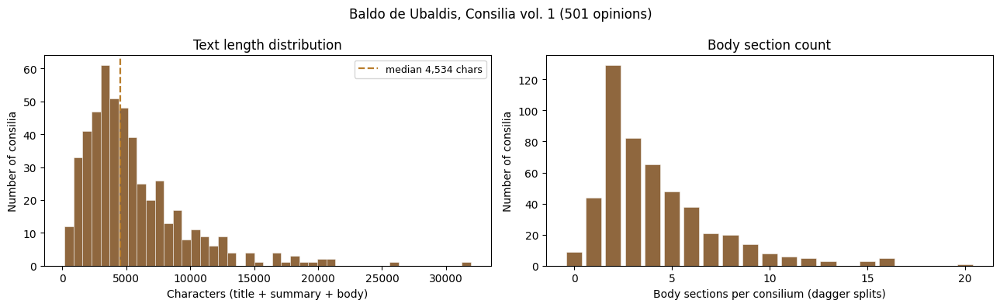

Shortest: n=473  (178 chars)
Longest : n=58  (31,941 chars)


In [28]:
import matplotlib.pyplot as plt
from collections import Counter

lengths = [
    len((c.get('title') or '') +
        (c.get('summary') or '') +
        ' '.join(c.get('body') or []))
    for c in consilia
]
section_counts = [len(c.get('body') or []) for c in consilia]

fig, axes = plt.subplots(1, 2, figsize=(13, 4))
fig.suptitle('Baldo de Ubaldis, Consilia vol. 1 (501 opinions)', fontsize=12)

axes[0].hist(lengths, bins=45, color='#7b4c1c', alpha=0.85, edgecolor='white', lw=.4)
axes[0].axvline(int(np.median(lengths)), color='#b87c2a', ls='--', lw=1.6,
                label=f'median {int(np.median(lengths)):,} chars')
axes[0].set_xlabel('Characters (title + summary + body)')
axes[0].set_ylabel('Number of consilia')
axes[0].set_title('Text length distribution')
axes[0].legend(fontsize=9)

sc = Counter(section_counts)
axes[1].bar(sc.keys(), sc.values(), color='#7b4c1c', alpha=0.85, edgecolor='white', lw=.4)
axes[1].set_xlabel('Body sections per consilium (dagger splits)')
axes[1].set_ylabel('Number of consilia')
axes[1].set_title('Body section count')

plt.tight_layout()
plt.show()

print(f'Shortest: n={consilia[np.argmin(lengths)]["n"]}  ({min(lengths)} chars)')
print(f'Longest : n={consilia[np.argmax(lengths)]["n"]}  ({max(lengths):,} chars)')


---
## 8  Semantic Embeddings with BGE-M3

Keyword search is powerful but brittle: a query for *property rights* will miss a
consilium that only uses *ius in re* or *dominium*. Semantic (vector) search finds
conceptually related texts even without shared vocabulary.

### Why BGE-M3?

The model [BAAI/bge-m3](https://huggingface.co/BAAI/bge-m3) was chosen for three reasons:

1. **Multilingual** — it maps Latin, German, and English queries into the same
   1024-dimensional vector space. A researcher can search in German and retrieve
   Latin texts directly.
2. **Long context** — supports up to 8192 tokens; a consilium's full text fits
   in one call.
3. **Cosine-ready** — embeddings are L2-normalised, so retrieval is a simple
   dot product.

### Generating embeddings

```bash
python src/embed_consilia.py --fp16          # GPU, float16, ~8 s for 501 consilia
python src/pipeline.py --embed-fp16          # runs automatically after segmentation
```

Each consilium is represented by `title + summary + body` joined into one passage.
The result is saved in the **SafeTensors** format — a compact binary container:

```
+------------------+
| 8 bytes          |  LE uint64: JSON header length
| N bytes (JSON)   |  {"embeddings": {dtype, shape, data_offsets}}
| 4 x 501 x 1024 B |  raw float32 data
+------------------+
Total: ~2.1 MB
```

This format is parsed directly in the browser with ~15 lines of vanilla JavaScript
(no library required).


In [29]:
from safetensors.numpy import load_file
import json, numpy as np
from pathlib import Path

tensors = load_file('output/embeddings.safetensors')
meta    = json.loads(Path('output/embeddings_meta.json').read_text(encoding='utf-8'))

E = tensors['embeddings']   # float32[N, D]
print(f'Shape      : {E.shape}  ({E.shape[0]} consilia x {E.shape[1]} dims)')
print(f'dtype      : {E.dtype}')
print(f'Model      : {meta["model"]}')
print(f'Norm (row 0): {np.linalg.norm(E[0]):.6f}  (should be ~1.0)')
mb = Path('output/embeddings.safetensors').stat().st_size / 1e6
print(f'File size  : {mb:.1f} MB')


Shape      : (501, 1024)  (501 consilia x 1024 dims)
dtype      : float32
Model      : BAAI/bge-m3
Norm (row 0): 1.000267  (should be ~1.0)
File size  : 2.1 MB


### 8.1  Nearest-neighbour search

Because all vectors are unit-normalised, **cosine similarity equals dot product**.
Finding the most similar consilium to a given one is a single matrix–vector multiply.


In [30]:
def find_similar(query_n: int, top_k: int = 8) -> None:
    query_id = f'consilium-baldo_cons_print_venice_1575_v1-{query_n}'
    try:
        idx = meta['ids'].index(query_id)
    except ValueError:
        print(f'n={query_n} not found'); return

    scores = E @ E[idx]                          # cosine similarity for all
    top    = np.argsort(scores)[::-1][1:top_k+1] # skip self (rank 0)

    print(f'Most similar to n={query_n}: "{meta["titles"][idx]}"')
    print('-' * 70)
    for i in top:
        print(f'  n={meta["ns"][i]:4d}  sim={scores[i]:.4f}  {meta["titles"][i]}')

# n=1: ecclesiastical union (canon law)
find_similar(1)
print()
# n=44: a different topic -- see whether the cluster changes
find_similar(44)


Most similar to n=1: "CONSILIVM PRIMVM."
----------------------------------------------------------------------
  n= 221  sim=0.7028  CONSILIVM CCXXI.
  n= 118  sim=0.6914  CONSILIVM CXVIII.
  n= 427  sim=0.6893  CONSILIVM CCCCXXVII.
  n= 353  sim=0.6868  CONSILIVM CCCLIII.
  n= 475  sim=0.6856  CONSILIVM CCCCLXXV.
  n= 481  sim=0.6818  CONSILIVM CCCCLXXXI.
  n= 300  sim=0.6810  CONSILIVM. CCC.
  n= 164  sim=0.6773  CONSILIVM CLXIIII.

Most similar to n=44: "CONSILIVM XLIIII."
----------------------------------------------------------------------
  n= 347  sim=0.7245  CONSILIVM CCCXLVII.
  n= 345  sim=0.7132  CONSILIVM CCCXLV.
  n= 323  sim=0.7012  CONSILIVM CCCXXIII .
  n= 252  sim=0.6998  CONSILIVM CCLII.
  n= 311  sim=0.6896  CONSILIVM CCCXI.
  n= 359  sim=0.6847  CONSILIVM CCCLIX
  n= 333  sim=0.6811  CONSILIVM CCCXXXIII.
  n= 203  sim=0.6801  CONSILIVM CCIII.


### 8.2  Visualising the embedding space

A 2-D PCA projection gives a rough sense of thematic clustering.
Each point is one consilium; colour encodes its position in the print sequence.
PCA captures only a fraction of the 1024-dimensional structure; UMAP (`pip install
umap-learn`) gives a richer non-linear view.


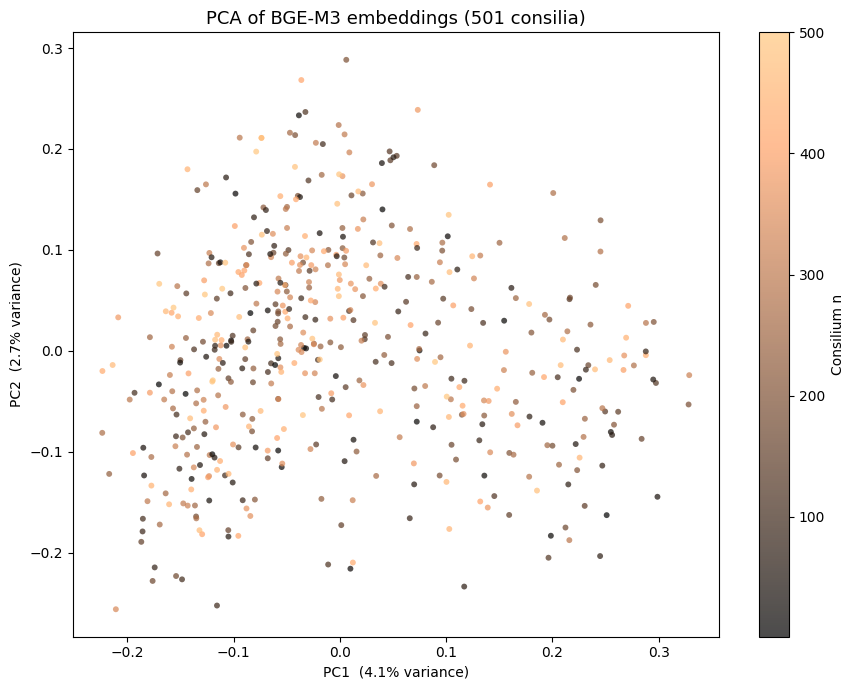

Variance explained by first 2 PCs: [4.13 2.7 ]


In [31]:
# PCA via numpy SVD (no sklearn dependency)
import matplotlib.pyplot as plt

E_c  = E - E.mean(axis=0)
U, S, Vt = np.linalg.svd(E_c, full_matrices=False)
coords   = U[:, :2] * S[:2]
var_ratio = (S[:2]**2) / (S**2).sum()

fig, ax = plt.subplots(figsize=(9, 7))
sc = ax.scatter(coords[:, 0], coords[:, 1],
                c=np.array(meta['ns'], dtype=float),
                cmap='copper', alpha=0.7, s=18, linewidths=0)
plt.colorbar(sc, ax=ax, label='Consilium n')
ax.set_title('PCA of BGE-M3 embeddings (501 consilia)', fontsize=13)
ax.set_xlabel(f'PC1  ({var_ratio[0]*100:.1f}% variance)')
ax.set_ylabel(f'PC2  ({var_ratio[1]*100:.1f}% variance)')
plt.tight_layout()
plt.show()

print(f'Variance explained by first 2 PCs: {(var_ratio*100).round(2)}')


### Interpreting the PCA projection

**What you are seeing:** each dot is one consilium. The x/y position is a
two-dimensional approximation of its location in a 1024-dimensional semantic
space. Colour encodes *print sequence* (consilium n), running from dark (n=1)
to light (n=501).

**What PCA preserves — and what it loses.** PCA finds the two directions of
maximum variance and discards the remaining 1022. Because BGE-M3 distributes
meaning across many dimensions, the first two PCs typically capture only
10–20% of total variance. Clusters that look separate here may overlap in
the full space, and vice versa. For a richer non-linear projection,
UMAP (`pip install umap-learn`) is the standard next step.

**What the colour gradient tells us.** If the colour were perfectly sorted
along a single axis, Baldo would have organised his opinions strictly by topic
in print order. The *mixed* colour pattern — dark and light points interspersed
throughout the cloud — suggests the opposite: the **print sequence is largely
thematic, not topical**. Related legal questions appear throughout the volume
rather than being grouped in blocks.

**What clusters mean.** Tight groups of points represent consilia whose full
text (title + summary + body) is semantically close in the model's
representation — similar legal vocabulary, argument structure, or cited
authorities. Outliers far from the main cloud are likely unusually long or
unusually short opinions, or opinions on a topic treated only once (e.g. a
unique procedural or commercial law question).

**Practical implication for search.** A semantic query does not navigate this
2-D map — it operates directly in the 1024-dimensional space. The similarity
scores returned by the search page reflect full-dimensional cosine similarity,
not 2-D proximity.


---
## 9  Thematic Exploration: Sexuality, Intimacy, and Reproduction

Medieval legal consilia rarely name their human subject directly. Sexuality, intimacy,
and reproduction enter the record dressed in the vocabulary of property, crime, and
status: *dos* (dowry), *concubinatus*, *adulterium*, *spurius*, *legitimatio*.
BGE-M3's multilingual embedding space captures these latent connections,
allowing us to retrieve and group consilia by theme even when the search terms
are in a different language than the text.

A note on ordering: **Baldo de Ubaldis did not arrange these consilia himself.**
The numbered sequence was established by a 16th-century printer, probably following
the order of cases as they arrived in manuscript rather than any thematic plan.
The clusters we find below are therefore emergent from the text, not from editorial
organisation — any groupings reflect genuine legal-semantic proximity across what
was, from Baldo's perspective, a collection of individual case responses.

### Five sub-themes

| Sub-theme | Key Latin terms | What the law cares about |
|-----------|-----------------|-------------------------|
| Adultery & sexual crime | *adulterium, stuprum, fornicatio* | Criminal punishment, statutory interpretation |
| Concubinage | *concubinatus, concubina, vis passa* | Donations, children's status, rape |
| Marriage & consummation | *copula carnalis, coniugium, dispensatio* | Validity, consanguinity, papal power |
| Legitimacy & birth | *spurius, legitimatus, naturalis* | Inheritance rights, form of legitimation |
| Dowry & marital property | *dos, dotis, soluto matrimonio* | Restitution, marital debt, statutory variations |


In [ ]:
import json, numpy as np
from pathlib import Path
from safetensors.numpy import load_file
from sentence_transformers import SentenceTransformer

# Load corpus and embeddings (already computed)
E    = load_file('output/embeddings.safetensors')['embeddings']
meta = json.loads(Path('output/embeddings_meta.json').read_text(encoding='utf-8'))
cs   = json.loads(Path('output/consilia.json').read_text(encoding='utf-8'))['consilia']

THEMES = {
    'Adultery & sexual crime': 'adulterium crimen mulier accusata maritus statuto punitur stuprum fornicatio',
    'Concubinage':             'concubinatus concubina vis passa filius naturalis donatio solutum solutam',
    'Marriage & consummation': 'copula carnalis matrimonium consanguineos coniugium dispensatio Papa consummatum',
    'Legitimacy & birth':      'filius spurius legitimatus naturalis princeps heres natus illegitimus',
    'Dowry & marital property':'dos dotis vxor restituenda matrimonium solutum maritus bona',
}

COLORS = {
    'Adultery & sexual crime': '#c0392b',
    'Concubinage':             '#8e44ad',
    'Marriage & consummation': '#2471a3',
    'Legitimacy & birth':      '#1e8449',
    'Dowry & marital property':'#d35400',
    'other':                   '#c8bfb0',
}

print('Embedding thematic seed queries with BGE-M3 ...')
model = SentenceTransformer('BAAI/bge-m3')
model.max_seq_length = 512
theme_vecs = {k: model.encode([v], normalize_embeddings=True)[0].astype(np.float32)
              for k, v in THEMES.items()}
scores = {k: E @ v for k, v in theme_vecs.items()}
print('Done.')


In [ ]:
# Top-10 consilia per theme with text excerpts
TOP_K = 10

for theme in THEMES:
    top_idx = np.argsort(scores[theme])[::-1][:TOP_K]
    print(f'\n{theme.upper()}')
    print('-' * 72)
    for j in top_idx:
        cid = meta['ids'][j]
        c   = cs[cid]
        txt = (c.get('summary') or ' '.join(c.get('body') or ['']))[:120]
        print(f'  n={meta["ns"][j]:4d}  {scores[theme][j]:.4f}  {txt}')


In [ ]:
# Assign each consilium its dominant theme (top-12 per theme, priority order)
TOP_K_LABEL = 12
priority    = list(THEMES.keys())
top_sets    = {t: set(np.argsort(scores[t])[::-1][:TOP_K_LABEL].tolist()) for t in THEMES}

labels = ['other'] * len(meta['ids'])
for j in range(len(meta['ids'])):
    for t in priority:
        if j in top_sets[t]:
            labels[j] = t
            break

from collections import Counter
cnt = Counter(labels)
print('Theme distribution:')
for t in priority + ['other']:
    print(f'  {t:35s}  {cnt[t]:3d} consilia')


In [ ]:
import umap
import plotly.graph_objects as go

print('Computing UMAP projection (all 501 consilia) ...')
reducer = umap.UMAP(n_components=2, random_state=42, min_dist=0.15, n_neighbors=20)
coords  = reducer.fit_transform(E)
print('Done.')

fig = go.Figure()

# Background: 'other' consilia in muted beige, plotted first
bg_idx = [j for j, l in enumerate(labels) if l == 'other']
fig.add_trace(go.Scatter(
    x=coords[bg_idx, 0], y=coords[bg_idx, 1],
    mode='markers',
    name='other',
    marker=dict(color='#c8bfb0', size=5, opacity=0.35),
    hovertemplate=(
        '<b>n=%{customdata[0]}</b><br>%{customdata[1]}<extra></extra>'),
    customdata=[[meta['ns'][j], meta['titles'][j]] for j in bg_idx],
))

# Thematic consilia: one trace per sub-theme
for theme in priority:
    idx = [j for j, l in enumerate(labels) if l == theme]
    if not idx:
        continue
    hover = [
        f'<b>n={meta["ns"][j]}</b>  sim={scores[theme][j]:.3f}<br>'
        f'{meta["titles"][j]}<br>'
        f'{(cs[meta["ids"][j]].get("summary") or "")[:140]}...'
        for j in idx
    ]
    fig.add_trace(go.Scatter(
        x=coords[idx, 0], y=coords[idx, 1],
        mode='markers+text',
        name=theme,
        marker=dict(color=COLORS[theme], size=12, opacity=0.90,
                    line=dict(color='white', width=1)),
        text=[str(meta['ns'][j]) for j in idx],
        textposition='top center',
        textfont=dict(size=8, color=COLORS[theme]),
        hovertemplate='%{customdata}<extra></extra>',
        customdata=hover,
    ))

fig.update_layout(
    title=dict(
        text='Sexuality, Intimacy & Reproduction in Baldo\'s Consilia<br>'
             '<sup>UMAP of BGE-M3 embeddings — top-12 consilia per sub-theme highlighted</sup>',
        font=dict(size=14)
    ),
    xaxis=dict(title='UMAP-1', showgrid=False, zeroline=False),
    yaxis=dict(title='UMAP-2', showgrid=False, zeroline=False),
    legend_title='Sub-theme',
    width=980, height=700,
    font=dict(family='Georgia, serif', size=11),
    plot_bgcolor='#faf8f4',
    paper_bgcolor='#faf8f4',
    hoverlabel=dict(font_size=11, font_family='Georgia, serif'),
)

fig.show()


### Close readings: key consilia

The visualization surfaces several clusters of exceptional interest.
Below we read the most significant consilia in each group.

**The Bernabò Visconti concubinage cluster (n=248, n=262, n=267)**
Three consilia form a tightly linked group. n=248 concerns a real historical case:
a donation made by **Bernabò Visconti** (lord of Milan, 1354–1385) to his concubine.
Bernabò was notorious for his many illegitimate children; Baldo had himself been
briefly imprisoned by him. n=262 generalises the question (*can a soldier or prince
donate to his concubine?*), and n=267 — the most substantial of the three — defines
concubinage in Roman law, distinguishes voluntary concubinage from rape (*vis passa*),
and works through the inheritance rights of natural versus spurious children.

**The adultery cluster (n=357, n=310)**
n=357 is a statutory interpretation case: a Piacenza statute prescribed decapitation
for *attempting* adultery. The perpetrator seized a woman, who cried out and he fled —
does this count? n=310 concerns a minor woman accused of adultery and the procedural
question of whether her confession is valid without a guardian (*curator*).

**The spurious children cluster (n=373, n=258, n=146, n=81)**
n=373 opens with a striking theological phrase (*man generates man, but what does
not conform to honest morals...*) before addressing whether the Emperor can legitimize
spurious and even incestuous children. n=258 establishes that spurious children born
of *damnatus coitus* (criminally illicit intercourse) cannot inherit a fief. n=146
and n=81 work through the technical form required for valid legitimation.


In [ ]:
# Full text of key consilia
KEY_CONSILIA = [
    (267, 'Concubinage: definition, rape, natural children, donations'),
    (248, 'The Bernabo Visconti concubinage donation (real case)'),
    (357, 'Attempted adultery and a Piacenza statute'),
    (373, 'Spurious children: imperial legitimation, theological framing'),
    (258, 'Spurious children from illicit intercourse cannot inherit a fief'),
]

for n, heading in KEY_CONSILIA:
    cid = f'consilium-baldo_cons_print_venice_1575_v1-{n}'
    c   = cs.get(cid)
    if not c:
        continue
    print(f'\n{"+" * 70}')
    print(f'n={n}  {c["title"]}')
    print(f'[{heading}]')
    print(f'{"-" * 70}')
    if c.get('summary'):
        print('SUMMARY:')
        print(c['summary'])
    print('BODY:')
    for i, sec in enumerate(c.get('body') or []):
        print(f'  [{i}] {sec[:300]}')
        if i >= 3:
            remaining = len(c['body']) - 4
            if remaining > 0:
                print(f'  ... ({remaining} more sections)')
            break


### Interpretation

Several patterns emerge from the semantic map:

**1. Sexuality enters legal discourse through property.** The most substantial
consilia (n=267, n=248, n=262) are not about sex per se but about the legal
consequences of sexual relationships for *property transfer* — can a prince donate
to his concubine? What does her child inherit? The intimate relationship is the
occasion; the legal question is always patrimonial.

**2. The category of *vis passa* (rape) functions as a legal exemption.** In n=267,
Baldo distinguishes between the woman who *chose* concubinage and the woman who
*suffered force*. This distinction matters for the children's status: children of a
woman who was coerced are treated differently from children of a voluntary concubine.
The legal system uses rape not primarily to protect women but to adjudicate property
rights for the resulting offspring.

**3. Legitimacy is a technology of social engineering.** The cluster around n=146,
n=373, and n=81 shows that the question of legitimation was intensely technical:
what exact wording must the prince use? Can a grandson of a spurious son be a
legitimate heir? Can the Emperor legitimize children born of incest?
Baldo's answers are precise and formalistic — validity turns on procedural form.

**4. The consilia are scattered across the volume.** The UMAP shows that these
thematically related consilia do *not* cluster in a single region of the print
sequence (their n-values range from 7 to 477). This confirms that the 16th-century
printer did not organize by legal topic: the thematic groupings are genuine
intellectual clusters in the embedding space, invisible in the printed order
and only recoverable through semantic search.

**5. The Bernabò Visconti case is a signature of Baldo's practice.** The three
concubinage consilia referencing Bernabò (Milan's lord during Baldo's career)
illustrate that Baldo's consilia respond to real, often politically charged cases.
Legal doctrine here is shaped by proximity to power: the question *can a prince
donate to his concubine?* is answered differently for a *dominus* with *plenitudo
potestatis* (full sovereign power) than for an ordinary soldier.


---
## 9  The Web Frontend

Both pages are plain HTML/CSS/JavaScript — no build step, no server, no framework.
They are served as a static site on **GitHub Pages**.

### 9.1  Reader (`index.html`)

Three-panel layout:
- **Sidebar** (230 px) — scrollable list of all consilia, synced via `IntersectionObserver`
- **Reader** — consilium cards with the original heading in `<h2>`, numbered summary
  behind a grey left border, and body sections split at each `†` marker
- **Image panel** (700 px) — the corresponding page scan with `‹` / `›` navigation;
  hidden below 1100 px

Deep-link: `index.html?n=44` scrolls directly to *Consilium* XLIIII.

*(Replace the cell below with a screenshot once captured in a browser.)*


In [32]:
# To capture a screenshot programmatically (requires playwright):
# pip install playwright && playwright install chromium
#
# from playwright.sync_api import sync_playwright
# with sync_playwright() as p:
#     page = p.chromium.launch().new_page()
#     page.set_viewport_size({'width': 1400, 'height': 900})
#     page.goto('file:///absolute/path/to/index.html?n=44')
#     page.screenshot(path='images/reader.png')
#     display(Image('images/reader.png', width=800))

print('Open index.html in a browser to view the reader.')
print('Save a screenshot as images/reader.png and replace this cell.')


Open index.html in a browser to view the reader.
Save a screenshot as images/reader.png and replace this cell.


### 9.2  Search (`search.html`)

#### Keyword mode

Powered by [MiniSearch](https://lucaong.github.io/minisearch/) — a tiny, fast,
pure-JavaScript full-text search library. Queries are normalised:

| Variant | Normalised to |
|---------|---------------|
| `j` | `i` |
| `v` | `u` |
| `ae`, `æ`, `ę` | `e` |

So *juris* finds *iuris*, and *aequitas* finds *equitas*. Fields are boosted:
title ×3, summary ×1.5, body ×1. Results show highlighted snippets around
the first match in the best-scoring field.

#### Semantic mode

The 2.1 MB `embeddings.safetensors` file is fetched once and kept in memory.
The query is embedded via one of two routes:

1. **HF Serverless Inference API** (free, no download needed)
2. **Local ONNX model** — `Xenova/bge-m3` (~130 MB, quantized) downloaded via
   CDN and cached in the browser; fully offline after the first download

Both paths produce identical normalised 1024-dim vectors. Results show the top
20 consilia with a **relative similarity bar** and **colour-coded scores**
(warm brown for high similarity, amber for medium).

*(Replace the cell below with a screenshot of search results.)*


### 9.3  Inline SafeTensors parser

Loading the embedding file in the browser requires no library. The SafeTensors
binary format is simple enough to parse in ~15 lines of vanilla JavaScript:

```javascript
async function loadSafetensors(url) {
  const buf = await fetch(url).then(r => r.arrayBuffer());
  const view = new DataView(buf);
  const headerLen = Number(view.getBigUint64(0, true));   // 8-byte LE
  const header = JSON.parse(
    new TextDecoder().decode(new Uint8Array(buf, 8, headerLen)));
  const dataStart = 8 + headerLen;
  const result = {};
  for (const [name, meta] of Object.entries(header)) {
    if (name === '__metadata__') continue;
    const [s, e] = meta.data_offsets;
    const bytes = buf.slice(dataStart + s, dataStart + e);
    result[name] = meta.dtype === 'F32' ? new Float32Array(bytes) : bytes;
  }
  return result;
}
```

The same logic in Python, for verification:


In [33]:
import struct

def load_safetensors_manual(path: str) -> dict:
    raw        = Path(path).read_bytes()
    header_len = struct.unpack_from('<Q', raw, 0)[0]
    header     = json.loads(raw[8 : 8 + header_len])
    data_start = 8 + header_len
    result = {}
    for name, m in header.items():
        if name == '__metadata__':
            continue
        s, e = m['data_offsets']
        chunk = raw[data_start + s : data_start + e]
        if m['dtype'] == 'F32':
            result[name] = np.frombuffer(chunk, dtype=np.float32).reshape(m['shape'])
        else:
            result[name] = chunk
    return result

manual = load_safetensors_manual('output/embeddings.safetensors')
print('Shape:', manual['embeddings'].shape)
print('Matches safetensors library:', (manual['embeddings'] == E).all())


Shape: (501, 1024)
Matches safetensors library: True


---
## 10  Sustainability and Reproducibility

### Regenerating everything from scratch

```bash
pip install -r requirements.txt

# Fast iteration (heuristic line breaks, no embedding) ~2 s
python src/pipeline.py --no-lb-model --no-embed

# Full quality run (Flair + GPU embedding) ~7 min + 8 s
python src/pipeline.py --embed-fp16

# CPU-only fallback (~15 min for embeddings)
python src/pipeline.py --embed-device cpu
```

### Staleness checks

The pipeline compares file modification times before running heavy stages:
embeddings are only re-generated when `consilia.json` is newer than
`embeddings.safetensors`. Pass `--no-embed` to always skip during development.

### Long-term search without Hugging Face

The search page has a *Download model* button that fetches `Xenova/bge-m3`
(~130 MB, quantized ONNX) via the jsDelivr CDN and stores it in the browser
cache. After the first download, semantic search runs entirely offline —
no dependency on any external API or service.

### Adding new volumes

Drop a new volume directory (with a `page/` subfolder) into `data/` and re-run
the pipeline. The segmenter and embedder process all volumes automatically;
the frontend adds a volume selector and merges the embeddings into the same
safetensors file.
